# Dog Breed Classification using CNN

In [2]:
import os
import sys
import numpy as np
import pandas as pd
#import cv2
import time
import json
from IPython.core.display import HTML
from matplotlib import pyplot as plt
import matplotlib.ticker as mticker
import keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.keras import backend as k
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import initializers
from tensorflow.keras import regularizers 
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback

from keras.layers import Conv2D, Flatten, Dense, MaxPooling2D, Dropout
from sklearn.metrics import accuracy_score
#############################
from tensorflow.keras.applications import ResNet50V2, VGG16, InceptionV3, MobileNetV2, DenseNet121
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import xml.etree.ElementTree as ET
from PIL import Image
#import tensorflow_datasets as tfds
#import tensorflow_addons as tfa

In [3]:
import sklearn

In [5]:
print(sklearn.__version__)

1.0.2


In [3]:
# Création de repertoire de stockage d'images
import requests
import tarfile
dataset_path = "Projet_Stanford_Dogs"
if not os.path.exists(dataset_path):
    os.mkdir(dataset_path)

In [100]:
# Télécharge des images sur le site Stanfors
packet_url = "http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar"
packet_file = os.path.basename(packet_url)
packet_file = os.path.join(dataset_path, packet_file)
with requests.get(packet_url, stream = True) as r:
    r.raise_for_status()
    with open(packet_file, "wb") as f:
        for chunk in r.iter_content(chunk_size = 8192):
            f.write(chunk)
with tarfile.open(packet_file) as tfile:
    tfile.extractall(dataset_path)

#######
packet_url = "http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar"
packet_file = os.path.basename(packet_url)
packet_file = os.path.join(dataset_path, packet_file)
with requests.get(packet_url, stream = True) as r:
    r.raise_for_status()
    with open(packet_file, "wb") as f:
        for chunk in r.iter_content(chunk_size = 8192):
            f.write(chunk)
with tarfile.open(packet_file) as tfile:
    tfile.extractall(dataset_path)


KeyboardInterrupt



## Affichage des données

In [4]:
# On recuperer les races 
print(os.listdir("Projet_Stanford_Dogs/Images/")[:20])
breed_list = os.listdir("Projet_Stanford_Dogs/Images/")

['n02115913-dhole', 'n02096177-cairn', 'n02105412-kelpie', 'n02086240-Shih-Tzu', 'n02096051-Airedale', 'n02108422-bull_mastiff', 'n02107142-Doberman', 'n02095570-Lakeland_terrier', 'n02085620-Chihuahua', 'n02087394-Rhodesian_ridgeback', 'n02093859-Kerry_blue_terrier', 'n02102177-Welsh_springer_spaniel', 'n02101388-Brittany_spaniel', 'n02097130-giant_schnauzer', 'n02098286-West_Highland_white_terrier', 'n02095889-Sealyham_terrier', 'n02085936-Maltese_dog', 'n02094258-Norwich_terrier', 'n02088364-beagle', 'n02085782-Japanese_spaniel']


In [5]:
# Get the dog labels
# get labels by splitting the folder name at dash
breeds = [breed.split('-',1)[1] for breed in breed_list]
print(len(breeds))
print("\n")

# view same of the labels
breed_selected = breeds[:20]
print("les 20 races sélectionnés :\n\n", breed_selected)

120


les 20 races sélectionnés :

 ['dhole', 'cairn', 'kelpie', 'Shih-Tzu', 'Airedale', 'bull_mastiff', 'Doberman', 'Lakeland_terrier', 'Chihuahua', 'Rhodesian_ridgeback', 'Kerry_blue_terrier', 'Welsh_springer_spaniel', 'Brittany_spaniel', 'giant_schnauzer', 'West_Highland_white_terrier', 'Sealyham_terrier', 'Maltese_dog', 'Norwich_terrier', 'beagle', 'Japanese_spaniel']


Text(0.5, 0.98, 'Quelques Images de Chiens')

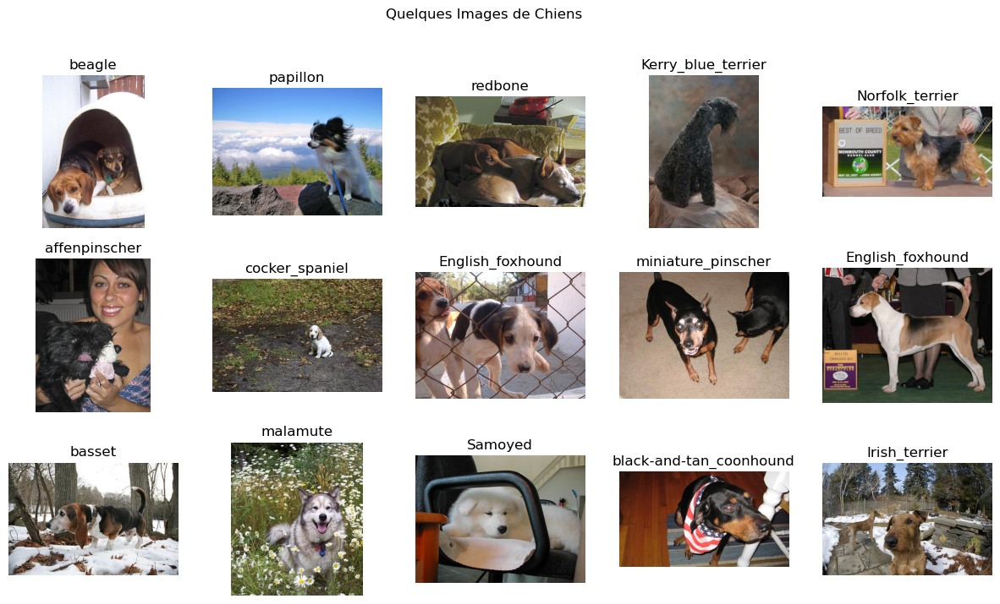

In [8]:
#  Train images
fig = plt.figure(figsize=(15, 8))
for i in range(15):
    axs = fig.add_subplot(6,8,i+1)
    breed = np.random.choice(breed_list)
    dog = np.random.choice(os.listdir("Projet_Stanford_Dogs/Annotation/" + breed))
    img = Image.open("Projet_Stanford_Dogs/Images/" + breed + "/" + dog + ".jpg")
    tree = ET.parse("Projet_Stanford_Dogs/Annotation/" + breed +"/" + dog)
    root = tree.getroot()
    object_1 = root = tree.findall("object")[0];
    name = object_1.find("name").text;
    axs.set_title(name)
    plt.imshow(img)
    plt.axis("off")
    
plt.suptitle("Quelques Images de Chiens")

In [9]:
breed_list.sort()

## Création label index

label2index = dict((name, index) for index, name in enumerate(breed_list))

index2label = dict(( index, name) for index, name in enumerate(breed_list))

images = []

annotations = []

for breed in breed_list:
    
    image_files = os.listdir("Projet_Stanford_Dogs/Images/" + breed)
    
    image_files.sort()
    
    images.extend([os.path.join("Projet_Stanford_Dogs/Images/" + breed, f) for f in image_files])
    
    annotations.extend([os.path.join("Projet_Stanford_Dogs/Annotations/", breed, f.replace(".jpg", "")) for f in image_files])

    
for idx, ann in enumerate(annotations):
    
    annotations[idx] = ann.split("/")[2]
    

## Data Train & Label

In [10]:
Xs = np.asarray(images)

Ys = np.asarray(annotations)

print("Xs shape", Xs.shape)

print(Xs[:5])
print("\n")
print("Ys shape", Ys.shape)

print(Ys[:5])


Xs shape (20580,)
['Projet_Stanford_Dogs/Images/n02085620-Chihuahua/n02085620_10074.jpg'
 'Projet_Stanford_Dogs/Images/n02085620-Chihuahua/n02085620_10131.jpg'
 'Projet_Stanford_Dogs/Images/n02085620-Chihuahua/n02085620_10621.jpg'
 'Projet_Stanford_Dogs/Images/n02085620-Chihuahua/n02085620_1073.jpg'
 'Projet_Stanford_Dogs/Images/n02085620-Chihuahua/n02085620_10976.jpg']


Ys shape (20580,)
['n02085620-Chihuahua' 'n02085620-Chihuahua' 'n02085620-Chihuahua'
 'n02085620-Chihuahua' 'n02085620-Chihuahua']


## Choix du sous-ensemble pour teste du code

In [11]:
X = Xs[:1000]

y = Ys[:1000]

## Conversion de label en numérique

In [12]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

In [13]:
# Label and one-hot encoding y labels
le = LabelEncoder()
le.fit(y)
y_target = to_categorical(le.transform(y), len(breed_selected))
print(y_target.shape)
y_target = np.array(y_target)

(1000, 20)


## Repartition de dataset en train data + test data

In [14]:
from keras.preprocessing.image import img_to_array, load_img

In [15]:
# load, resize images and store as array
images = np.array([img_to_array(load_img(img, target_size = (299,299))) for img in X]) 

x_train, x_test, y_train, y_test = train_test_split(images, y_target, test_size = 0.3,stratify = np.array(y), random_state = 120) 

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,test_size = 0.3,stratify=np.array(y_train),random_state = 120)

print('Training Dataset Size: ', x_train.shape)
print("\n")

print('Training Label Size: ', y_train.shape)
print("\n")

print('Validation Dataset Size: ', x_val.shape)
print("\n")

print('Validation Label Size: ', y_val.shape)
print("\n")

print('Testing Dataset Size: ', x_test.shape)
print("\n")

print('Testing Label Size: ', y_test.shape)

import gc
del images
gc.collect()

Training Dataset Size:  (490, 299, 299, 3)


Training Label Size:  (490, 20)


Validation Dataset Size:  (210, 299, 299, 3)


Validation Label Size:  (210, 20)


Testing Dataset Size:  (300, 299, 299, 3)


Testing Label Size:  (300, 20)


0

## Preparation des données & data augmetation

In [16]:
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

In [17]:
batch_size = 32

train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 30,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True
)


train_generator = train_datagen.flow(x_train,y_train,shuffle=False,batch_size = batch_size)

In [18]:
val_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

valid_generator = val_datagen.flow(x_val, y_val, shuffle = False, batch_size = batch_size)

In [19]:
test_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

test_generator = val_datagen.flow(x_test, y_test, shuffle = False, batch_size = batch_size)

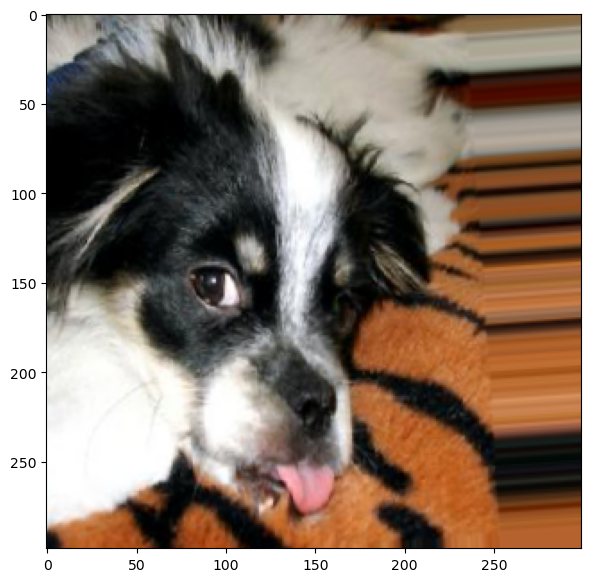

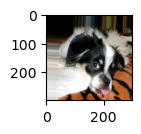

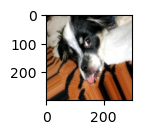

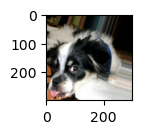

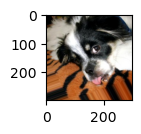

In [20]:
img_id = 8
dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                              shuffle = False, batch_size = batch_size, seed=2)
plt.figure(figsize=(40, 30))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs):
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    plt.show()

# Convolutional Neurl Network 

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Input, concatenate
from keras.layers import Dropout, Flatten, Dense

In [ ]:
model_cnn = Sequential()

model_cnn.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(299, 299, 3)))
model_cnn.add(layers.MaxPooling2D((2, 2)))
model_cnn.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(layers.MaxPooling2D((2, 2)))
model_cnn.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_cnn.add(layers.MaxPooling2D((2, 2)))
model_cnn.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_cnn.add(layers.MaxPooling2D((2, 2)))
model_cnn.add(Flatten())
model_cnn.add(Dense(512, activation = 'relu'))
model_cnn.add(Dense(20, activation = 'softmax'))

In [ ]:
model_cnn.summary()

In [ ]:
model_cnn.compile(loss= 'categorical_crossentropy', optimizer= keras.optimizers.Adam(learning_rate= 1e-3), metrics= ['accuracy'])

In [ ]:
history = model_cnn.fit(
    
    train_generator,
    
    batch_size = batch_size,
    
    epochs = 100,
    
    validation_data = valid_generator,
        
    verbose = 1, 
    
    shuffle = True
)

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))


plt.plot(epochs, acc, label='Training accuracy')
plt.plot(epochs, val_acc, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.figure()


plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

In [ ]:
(eval_loss, eval_accuracy) = model_cnn.evaluate(valid_generator, batch_size= batch_size, verbose= 1)
print('Validation Loss: ', eval_loss)
print('Validation Accuracy:', eval_accuracy)

In [ ]:
score = model_cnn.evaluate(test_generator, verbose=0)
print('Test accuarcy: {:0.2f}%'.format(score[1] * 100))

In [ ]:
x_test1 = x_test/255.
#test_predictions 
test_predictions=model_cnn.predict(x_test1) 

## obtention des prédictions du modèle
predictions = le.classes_[np.argmax(test_predictions, axis = 1)] # get labels and reverse back to get the text labels

# Obtenir des modalités de variable cible
target_labels1 = le.classes_[np.argmax(y_test, axis = 1)]

In [ ]:
predict_df2 = pd.DataFrame({"Target_labels": target_labels1, "Predictions": predictions})
predict_df2.head(20)

In [ ]:
# Précision de la mesure

correct = (target_labels1 == predictions)
accuracy = correct.sum()/correct.size
print(accuracy)

In [ ]:
plt.figure(figsize = (40, 50))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 8)):# random 30 images
    plt.subplot(6, 5, counter + 1)
    plt.subplots_adjust(hspace = 0.6)
    actual = str(target_labels1[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))    
    plt.imshow(x_test[i].astype(np.uint8) / 255)
    plt.axis("off")
    plt.title("Actual:" +actual+ "\nPredict:" +predicted+ "\nConf:" +conf, fontsize = 18)
    
plt.show()

## Model inceptionV3

In [21]:
from tensorflow.keras import layers, models
from tensorflow.keras.layers import GlobalAveragePooling2D,  Activation
from tensorflow.keras.optimizers import Adam, RMSprop

In [48]:
pre_trained_model =  InceptionV3(weights = "imagenet", input_shape=(299,299,3), include_top= False)

for layer in pre_trained_model.layers:
    layer.trainable=False

In [49]:
model = models.Sequential()
model.add(pre_trained_model)
model.add(GlobalAveragePooling2D())
model.add(Flatten()) 
model.add(Dropout(0.3))
model.add(Dense(2048, activation = 'relu'))
model.add(Dense(1024, activation = 'relu'))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(256, activation = 'relu'))
model.add(Dense(len(breed_selected), activation = 'softmax'))

In [50]:
model.compile(optimizer= keras.optimizers.Adam(learning_rate=1e-3), loss ='categorical_crossentropy', metrics =['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_5 (Dense)             (None, 2048)              4196352   
                                                                 
 dense_6 (Dense)             (None, 1024)              2098176   
                                                      

In [53]:
#plot_model(model, to_file = "model.png", show_shapes = True, show_layer_names = True)

In [54]:
epochs = 20
start_time = time.time()

history = model.fit_generator(
    train_generator, 
    epochs = epochs,
    validation_data = valid_generator, 
    verbose = 1)
excution_time = (time.time() - start_time)/60.0
print('Training time: {:.1f}s'.format(excution_time))

/tmp/ipykernel_41127/3971313620.py:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/20
16/16 [==============================] - 106s 6s/step - loss: 1.4317 - accuracy: 0.5735 - val_loss: 0.2986 - val_accuracy: 0.9000
Epoch 2/20
16/16 [==============================] - 104s 7s/step - loss: 0.3359 - accuracy: 0.8980 - val_loss: 0.1651 - val_accuracy: 0.9238
Epoch 3/20
16/16 [==============================] - 108s 7s/step - loss: 0.1683 - accuracy: 0.9367 - val_loss: 0.1923 - val_accuracy: 0.9238
Epoch 4/20
16/16 [==============================] - 101s 6s/step - loss: 0.1231 - accuracy: 0.9633 - val_loss: 0.1802 - val_accuracy: 0.9381
Epoch 5/20
16/16 [==============================] - 98s 6s/step - loss: 0.1791 - accuracy: 0.9469 - val_loss: 0.2901 - val_accuracy: 0.9143
Epoch 6/20
16/16 [==============================] - 105s 7s/step - loss: 0.1935 - accuracy: 0.9408 - val_loss: 0.1810 - val_accuracy: 0.9429
Epoch 7/20
16/16 [==============================] - 111s 7s/step - loss: 0.1487 - accuracy: 0.9510 - val_loss: 0.1615 - val_accuracy: 0.9333
Epoch 8/20
16/

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))


plt.plot(epochs, acc, "r", label='Training accuracy')
plt.plot(epochs, val_acc, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.figure()


plt.plot(epochs, loss, "r", label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

NameError: name 'history' is not defined

In [57]:
(eval_loss, eval_accuracy) = model.evaluate(valid_generator, batch_size= batch_size, verbose= 1)
print('Validation Loss: ', eval_loss)
print('Validation Accuracy:', eval_accuracy)

7/7 [==============================] - 25s 3s/step - loss: 0.5584 - accuracy: 0.9095
Validation Loss:  0.558428943157196
Validation Accuracy: 0.9095237851142883


In [58]:
x_test1 = test_generator 
#test_predictions 
test_predictions=model.predict(x_test1) 

# get model predictions
predictions = le.classes_[np.argmax(test_predictions, axis = 1)] # get labels and reverse back to get the text labels

# Get target labels
target_labels = le.classes_[np.argmax(y_test, axis = 1)]

10/10 [==============================] - 45s 4s/step


## Stockage dans un dataframe

In [59]:
predict_df = pd.DataFrame({"Target_labels": target_labels, "Predictions": predictions})

In [60]:
predict_df.head(10)

,Target_labels,Predictions
0,n02086240-Shih-Tzu,n02086240-Shih-Tzu
1,n02085620-Chihuahua,n02085620-Chihuahua
2,n02085620-Chihuahua,n02085620-Chihuahua
3,n02085936-Maltese_dog,n02085936-Maltese_dog
4,n02086240-Shih-Tzu,n02086240-Shih-Tzu
5,n02086240-Shih-Tzu,n02086240-Shih-Tzu
6,n02086240-Shih-Tzu,n02086240-Shih-Tzu
7,n02085936-Maltese_dog,n02085936-Maltese_dog
8,n02086079-Pekinese,n02086079-Pekinese
9,n02085936-Maltese_dog,n02085936-Maltese_dog


## Précision de la mesure

In [61]:
# Précision de la mesure

correct = (target_labels == predictions)
accuracy = correct.sum()/correct.size
print(accuracy)

0.96


In [109]:
import random

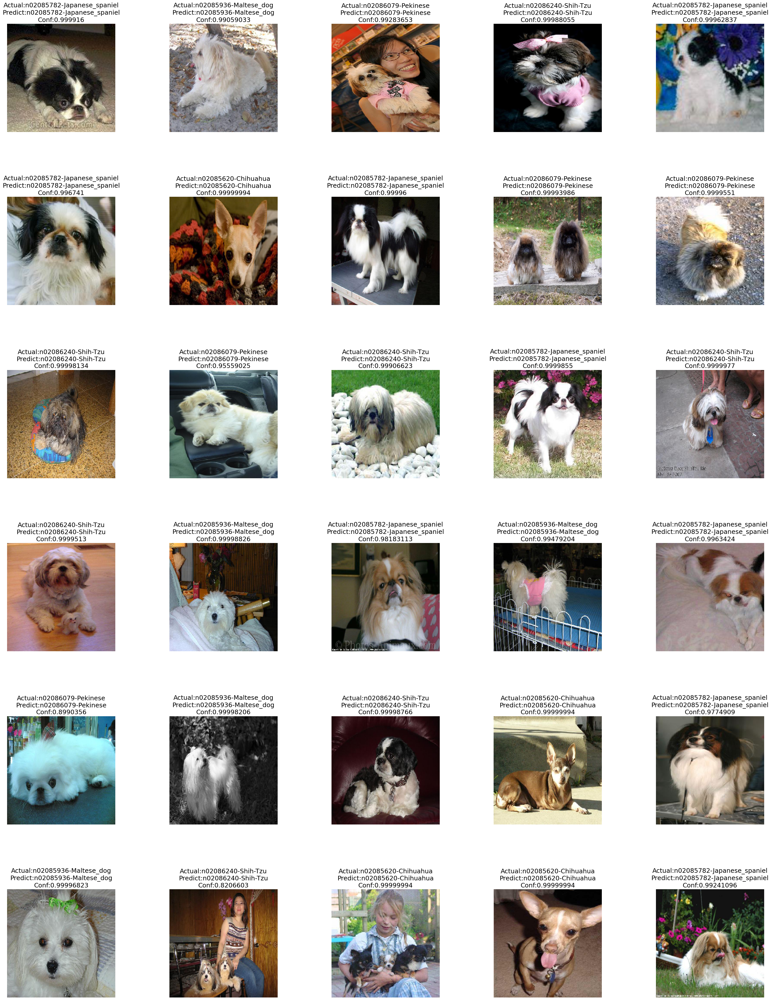

In [131]:
plt.figure(figsize = (40, 50))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)):# random 30 images
    plt.subplot(6, 5, counter + 1)
    plt.subplots_adjust(hspace = 0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))    
    plt.imshow(x_test[i].astype(np.uint8) / 255)
    plt.axis("off")
    plt.title("Actual:" + actual + "\n" + "Predict:" +predicted, color =  "red" + "\n"+ "Conf:" +conf, fontsize = 18)
    
plt.show()
     

In [111]:
import h5py

In [112]:
model.save("inceptionV3.h5")

/home/alseny/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [113]:
model.save("inceptionV.hdf5")